# Pokémon Project.

### About the dataset

<p>This data set includes <b><i>800 Pokemons</i></b>, including their <b>Name, Type_1</b> and <b>Type_2 powers</b>,
    and basic stats like <b>HP, Attack, Defense, Special Attack, Special Defense, and Speed</b>.
    and this dataset also contains <b>Generation</b> and <b>Legendary</b></p> 

1) <b><i>Name:</i></b> The names of the all 800 pokemons<br>
2) <b><i>Type_1 and Type_2 :</i></b> Are the powers like water, fire, electric... etc.<br>
3) <b><i>Hp (Hit points) :</i></b> is a kind of like a measure of Pokémon's stamina and health.<br>
4) <b><i>Attack, Defense, Special Attack, Special Defense, and Speed :</i></b> basic stats<br>
5) <b><i>Generation :</i></b>A generation is a grouping of the Pokémon games that separates them based on the Pokémon<br>they include. In each generation, a new set of Pokémon, moves, and Abilities that did not exist<br>in the previous generation are released.<br>
6) <b><i>Legendary :</i></b>legendary pokemons are a group of incredibly rare and often they are the powerful pokemons

## Data importing and setting up

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cufflinks as cf

from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot

init_notebook_mode(connected=True)
cf.go_offline()

# py.tools.set_credentials_file(username='osthe', api_key='aUR5UwpFH0RAantgObT5')
%matplotlib inline


/usr/local/lib/python3.6/dist-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.24) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


In [34]:
df=pd.read_csv("Pokemon.csv")

In [35]:
df.head(2)

,#,Name,Type_1,Type_2,Total,HP,Attack,Defense,Sp_Atk,Sp_Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False


In [39]:
df=df.replace({'Generation': {1: "G1",2: "G2",3:"G3",4:"G4",5:"G5",6:"G6"}})
df.head(10)

,#,Name,Type_1,Type_2,Total,HP,Attack,Defense,Sp_Atk,Sp_Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,G1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,G1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,G1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,G1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,G1,False
5,5,Charmeleon,Fire,NaN,405,58,64,58,80,65,80,G1,False
6,6,Charizard,Fire,Flying,534,78,84,78,109,85,100,G1,False
7,6,CharizardMega Charizard X,Fire,Dragon,634,78,130,111,130,85,100,G1,False
8,6,CharizardMega Charizard Y,Fire,Flying,634,78,104,78,159,115,100,G1,False
9,7,Squirtle,Water,NaN,314,44,48,65,50,64,43,G1,False


changing the <b>Generation</b> values to string for better view 

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 13 columns):
#             800 non-null int64
Name          800 non-null object
Type_1        800 non-null object
Type_2        414 non-null object
Total         800 non-null int64
HP            800 non-null int64
Attack        800 non-null int64
Defense       800 non-null int64
Sp_Atk        800 non-null int64
Sp_Def        800 non-null int64
Speed         800 non-null int64
Generation    800 non-null object
Legendary     800 non-null bool
dtypes: bool(1), int64(8), object(4)
memory usage: 75.9+ KB


this dataset has 800 different pokemons and 13 columns in the dataset. And we can see that pokemons with dual power are 414 nos.

In [38]:
df["Type_1"].value_counts()

Water       112
Normal       98
Grass        70
Bug          69
Psychic      57
Fire         52
Electric     44
Rock         44
Ground       32
Dragon       32
Ghost        32
Dark         31
Poison       28
Fighting     27
Steel        27
Ice          24
Fairy        17
Flying        4
Name: Type_1, dtype: int64

In [5]:
df["Type_1"].unique()

array(['Grass', 'Fire', 'Water', 'Bug', 'Normal', 'Poison', 'Electric',
       'Ground', 'Fairy', 'Fighting', 'Psychic', 'Rock', 'Ghost', 'Ice',
       'Dragon', 'Dark', 'Steel', 'Flying'], dtype=object)

From the <b>Type_1</b> column we are able to get <b>18</b> diffrenet pokemon powers listed below.

In [6]:
df["Type_2"].unique()

array(['Poison', nan, 'Flying', 'Dragon', 'Ground', 'Fairy', 'Grass',
       'Fighting', 'Psychic', 'Steel', 'Ice', 'Rock', 'Dark', 'Water',
       'Electric', 'Fire', 'Ghost', 'Bug', 'Normal'], dtype=object)

<p>If any power is mentioned in <b>Type_2</b> column for a pokemon states that the pokemon has both <b>Type_1</b> and <b>Type_2</b> powers. As we can see above that shows <b>nan</b> says that there are some pokemons with only <b>Type_1</b> powers.</p>  

### Comparing the Type_1 and Type_2  pokemons on their frequency...

In [7]:
df_type1=pd.value_counts(df["Type_1"][df["Type_2"].isnull()]).to_frame().reset_index()
df_type1.columns = ['Pokemon_Type','Count']

df_type2=pd.value_counts(df["Type_1"][df["Type_2"].notnull()]).to_frame().reset_index()
df_type2.columns = ['Pokemon_Type','Count']

In [8]:
df_type1

,Pokemon_Type,Count
0,Normal,61
1,Water,59
2,Psychic,38
3,Grass,33
4,Fire,28
5,Electric,27
6,Fighting,20
7,Bug,17
8,Fairy,15
9,Poison,15


in <b>Type_1</b> we can see that <b>Normal</b> pokemon is more in frequency compared to other pokemons.

In [9]:
df_type2

,Pokemon_Type,Count
0,Water,53
1,Bug,52
2,Normal,37
3,Grass,37
4,Rock,35
5,Fire,24
6,Ghost,22
7,Steel,22
8,Dragon,21
9,Dark,21


in <b>Type_2</b> we can see that <b>Water</b> pokemon is more in frequency compared to other pokemons.

Now let's have a better view by plotting <b>Type_1</b> and <b>Type_2</b> frequency distribution into a <b>pie plot<b> using matplotlib

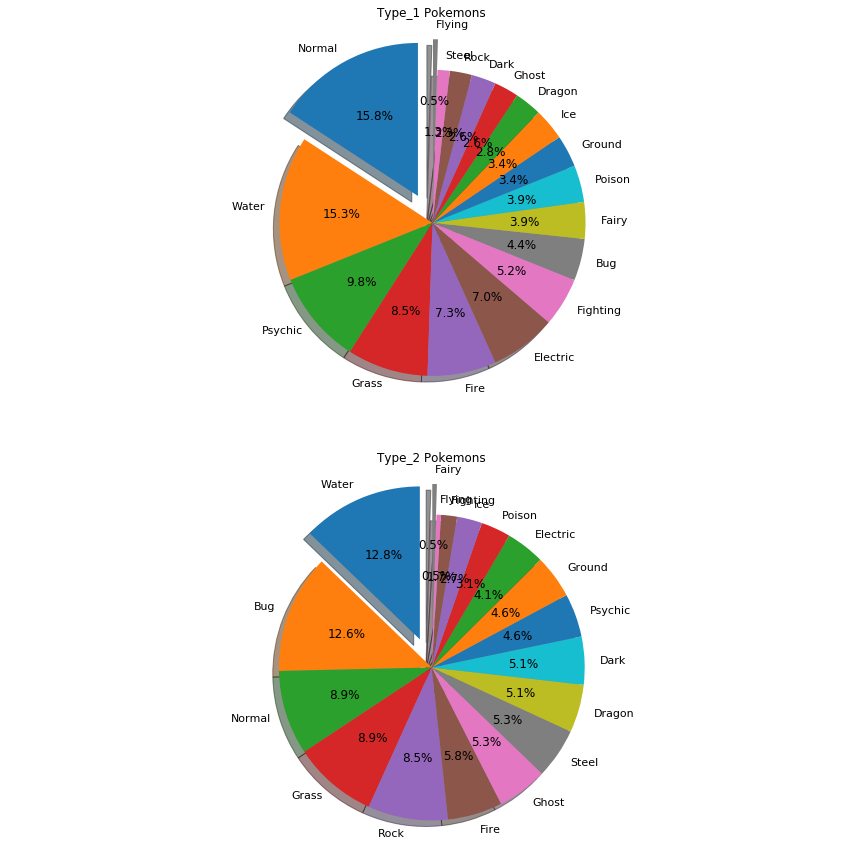

In [40]:
labels = list(df_type1["Pokemon_Type"])
sizes = list(df_type1["Count"])

labels1 = list(df_type2["Pokemon_Type"])
sizes1 = list(df_type2["Count"])
explode = (0.1, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.1)

fig1, ax1 = plt.subplots(2,1,figsize=(15,15))
ax1[0].set_title("Type_1 Pokemons")
ax1[0].pie(sizes,explode=explode, labels=labels, autopct='%1.1f%%',radius=0.5,
        shadow=True, startangle=90)
ax1[0].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

ax1[1].set_title("Type_2 Pokemons")
ax1[1].pie(sizes1,explode=explode, labels=labels1, autopct='%1.1f%%',radius=0.5,
        shadow=True, startangle=90)
ax1[1].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

Now we have a better view...

### Comparing the Type_1 and Type_2 pokemons based on their overall Total.. using seaborn's boxplot.

In [11]:
Type_1_df2=df[df["Type_2"].isnull()]
Type_2_df2=df[df["Type_2"].notnull()]

In [41]:
Type_1_df2.head()

,#,Name,Type_1,Type_2,Total,HP,Attack,Defense,Sp_Atk,Sp_Def,Speed,Generation,Legendary
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,G1,False
5,5,Charmeleon,Fire,NaN,405,58,64,58,80,65,80,G1,False
9,7,Squirtle,Water,NaN,314,44,48,65,50,64,43,G1,False
10,8,Wartortle,Water,NaN,405,59,63,80,65,80,58,G1,False
11,9,Blastoise,Water,NaN,530,79,83,100,85,105,78,G1,False


Copying the <b>"Type_1 pokemons"</b> to <b><i>Type_1_df2</i></b> and <b>"Type_2 pokemons"</b> to <b><i>Type_2_df2</i></b>

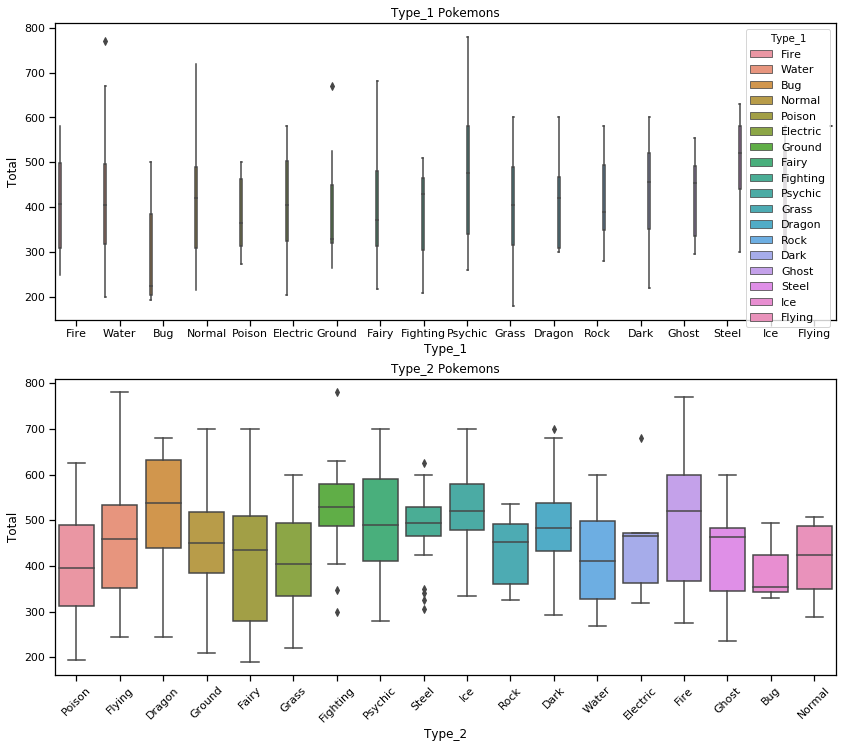

In [47]:
f,ax=plt.subplots(2,1,figsize=(14,12))
ax[0].set_title("Type_1 Pokemons")
ax[1].set_title("Type_2 Pokemons")
plt.xticks(rotation=45)
sns.set_context(context="notebook")
sns.boxplot(x="Type_1", y="Total", data=Type_1_df2,ax=ax[0],hue=Type_1_df2["Type_1"])
sns.boxplot(x="Type_2", y="Total", data=Type_2_df2,ax=ax[1])

plt.show()

Done...!, now we can easily compare the <b>Type_1</b> pokemon's <b>Total</b> with <b>Type_2</b> pokemon.<br>
<b>For Ex:</b><br>
Flying pokemons in Type_1 have very less Total power, in Type_2 have a max Total power of 780 or 790 and their median total power is 470, so most of their total powers lie between 350 to 530

### Comparing stats of Type_1 and Type_2 pokemons based on their Generation... using plotly and cufflinks

In [13]:
y=["G1","G2","G3","G4","G5","G6"]
Type_2_df_GT=pd.DataFrame({"Generation":["G1","G2","G3","G4","G5","G6"],
                    "Count":[df["Name"][(df["Generation"]==i) & (df["Type_2"].notnull())].count() for i in y],
                    "HP":[df["HP"][(df["Generation"]==i) & (df["Type_2"].notnull())].max() for i in y],
                    "Attack":[df["Attack"][(df["Generation"]==i) & (df["Type_2"].notnull())].max() for i in y],
                    "Defense":[df["Defense"][(df["Generation"]==i) & (df["Type_2"].notnull())].max() for i in y],
                    "Sp_Atk":[df["Sp_Atk"][(df["Generation"]==i) & (df["Type_2"].notnull())].max() for i in y],
                    "Sp_Def":[df["Sp_Def"][(df["Generation"]==i) & (df["Type_2"].notnull())].max() for i in y],
                    "Speed":[df["Speed"][(df["Generation"]==i) & (df["Type_2"].notnull())].max() for i in y]})

In [14]:
Type_1_df_GT=pd.DataFrame({"Generation":["G1","G2","G3","G4","G5","G6"],
                     "Count":[df["Name"][(df["Generation"]==i) & (df["Type_2"].isnull())].count() for i in y],
                     "HP":[df["HP"][(df["Generation"]==i) & (df["Type_2"].isnull())].max() for i in y],
                     "Attack":[df["Attack"][(df["Generation"]==i) & (df["Type_2"].isnull())].max() for i in y],
                     "Defense":[df["Defense"][(df["Generation"]==i) & (df["Type_2"].isnull())].max() for i in y],
                     "Sp_Atk":[df["Sp_Atk"][(df["Generation"]==i) & (df["Type_2"].isnull())].max() for i in y],
                     "Sp_Def":[df["Sp_Def"][(df["Generation"]==i) & (df["Type_2"].isnull())].max() for i in y],
                     "Speed":[df["Speed"][(df["Generation"]==i) & (df["Type_2"].isnull())].max() for i in y]})

In [15]:
Type_1_df_GT.iplot(kind="bar",x="Generation",title="Type_1 Pokemon",xTitle="Generation")

In [16]:
Type_2_df_GT.iplot(kind="bar",x="Generation",title="Type_2 Pokemon",xTitle="Generation")

### Correlation coefficient between the stats in Type_1 and Type_2 pokemons... using matplotlib and seaborn

In [17]:
TYPE2_POK=Type_2_df2[["Total","HP","Attack","Defense","Sp_Atk","Sp_Def","Speed","Generation"]].corr()
TYPE1_POK=Type_1_df2[["Total","HP","Attack","Defense","Sp_Atk","Sp_Def","Speed","Generation"]].corr()

[]

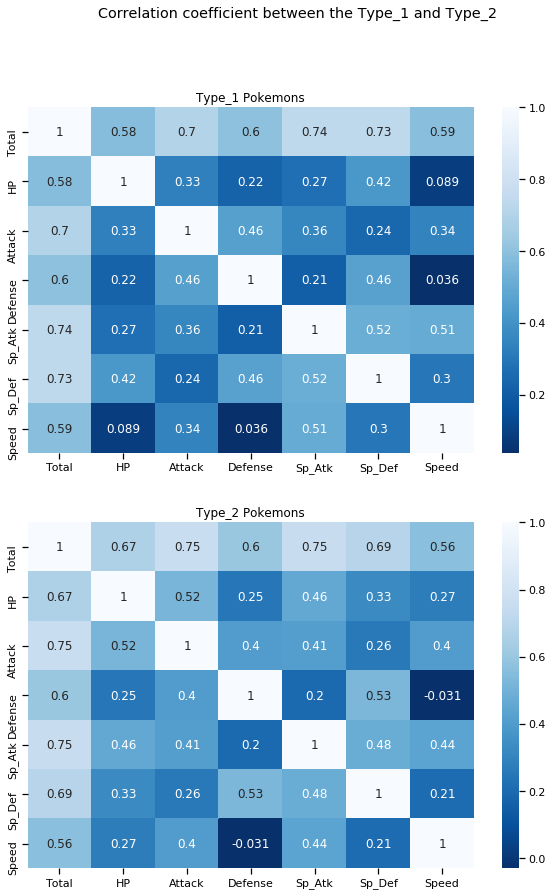

In [18]:
f, ax = plt.subplots(2,1,figsize=(10,14))
ax[0].set_title("Type_1 Pokemons")
ax[1].set_title("Type_2 Pokemons")
sns.heatmap(TYPE1_POK,annot=True,cmap="Blues_r",ax=ax[0])
sns.heatmap(TYPE2_POK,annot=True,cmap="Blues_r",ax=ax[1])
f.suptitle("Correlation coefficient between the Type_1 and Type_2")
plt.plot()

In type_2 pokemons there is a negative correlation between <b>speed</b> and <b>defense</b>..<br>
it shows that when the type_2 pokemons speed inceases there defense drops down by 31points and vice-versa   


### Ploting the Correlation between speed and defense of type_2 pokemons

In [19]:
Type_2_df2[["Defense","Speed"]].iplot(kind="scatter",x="Speed",y="Defense",mode="markers",xTitle="Speed",yTitle="Defense")

### Counting the Generation pokemons in Type_1 and Type_2

[]

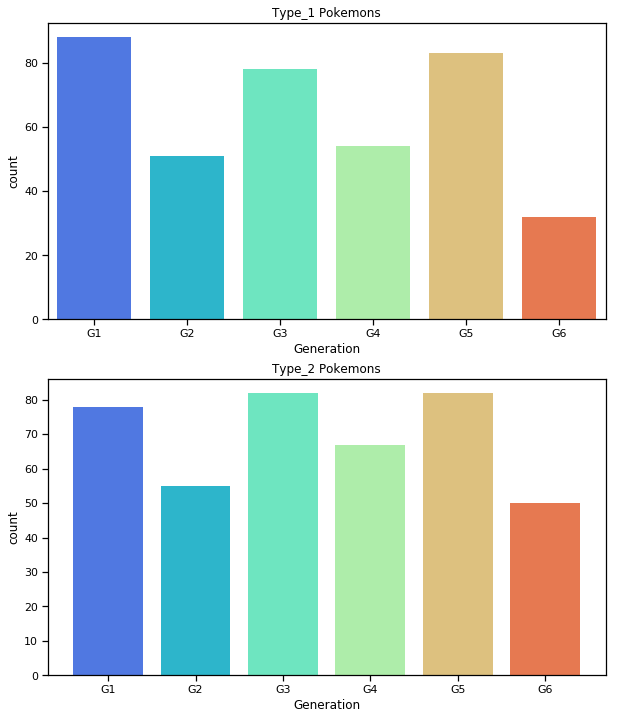

In [20]:
fig,ax=plt.subplots(2,1,figsize=(10,12))
ax[0].set_title("Type_1 Pokemons")
ax[1].set_title("Type_2 Pokemons")
sns.countplot(x="Generation",data=Type_1_df2,palette="rainbow",ax=ax[0])
sns.countplot(x="Generation",data=Type_2_df2,palette="rainbow",ax=ax[1])
plt.plot()

Now we can see that more Generation 1 pokemons are in Type_1 than Type_2

### Creating a stacked bar

In [21]:
x=['Grass', 'Fire', 'Water', 'Bug', 'Normal', 'Poison', 'Electric',
       'Ground', 'Fairy', 'Fighting', 'Psychic', 'Rock', 'Ghost', 'Ice',
       'Dragon', 'Dark', 'Steel', 'Flying']
df_stack=pd.DataFrame({"Pokemons":df["Type_1"].unique(),
               "G1":[len(df[(df["Generation"]=="G1") & (df["Type_1"]==i)]) for i in x],
                "G2":[len(df[(df["Generation"]=="G2") & (df["Type_1"]==i)]) for i in x],
                "G3":[len(df[(df["Generation"]=="G3") & (df["Type_1"]==i)]) for i in x],
                "G4":[len(df[(df["Generation"]=="G4") & (df["Type_1"]==i)]) for i in x],
                "G5":[len(df[(df["Generation"]=="G5") & (df["Type_1"]==i)]) for i in x],
                "G6":[len(df[(df["Generation"]=="G6") & (df["Type_1"]==i)]) for i in x]
               })

In [22]:
df_stack.iplot(kind="bar",x="Pokemons",barmode="stack",title="Pokemons by Type")

You can see that water pokemons are from all the 6 generations.  

### Just simply trying SURFACE plot in plotly 

In [23]:
Type_1_df2[["HP","Attack","Defense"]].iplot(kind="surface")

### Creating Boxplots of stats of Type_1 and Type_2 pokemons

In [24]:
Type_1_df2[["HP","Attack","Defense","Sp_Atk","Sp_Def","Speed"]].iplot(kind="box",title="Type_1 Pokemons")

In [25]:
Type_2_df2[["HP","Attack","Defense","Sp_Atk","Sp_Def","Speed"]].iplot(kind="box",title="Type_2 Pokemons")

Now we can see that Health (HP) of Type_1 pokemons are more compared to Type_2

### Lets find out how many Legendary pokemons are there in Type_1 and Type_2

In [26]:
# q=Type_1_df2["Name"][(Type_1_df2["Generation"]=="G3") & Type_1_df2["Legendary"]==True].count()
y=["G1","G2","G3","G4","G5","G6"]
df_Legen_T1=pd.DataFrame({"Generation":y,
   "Legendary_Pokemons":[Type_1_df2["Name"][(Type_1_df2["Generation"]==i) & (Type_1_df2["Legendary"]==True)].count() for i in y],
   "NON_Legendary_Pokemon":[Type_1_df2["Name"][(Type_1_df2["Generation"]==i) & (Type_1_df2["Legendary"]==False)].count() for i in y]})
df_Legen_T2=pd.DataFrame({"Generation":y,
   "Legendary_Pokemons":[Type_2_df2["Name"][(Type_2_df2["Generation"]==i) & (Type_2_df2["Legendary"]==True)].count() for i in y],
   "NON_Legendary_Pokemon":[Type_2_df2["Name"][(Type_2_df2["Generation"]==i) & (Type_2_df2["Legendary"]==False)].count() for i in y]})

In [27]:
df_Legen_T1.iplot(kind="bar",x="Generation",title="Type_1 Pokemons")

In [28]:
df_Legen_T2.iplot(kind="bar",x="Generation",title="Type_2 Pokemons")

we can see that legendary pokemons are less in both Type_1 and Type_2

In [29]:
Type_1_df2[["HP","Attack"]].iplot(kind="scatter",x="HP",y="Attack",mode="markers",xTitle="HP",yTitle="Attack")

In [30]:
Type_2_df2[["HP","Attack"]].iplot(kind="scatter",x="HP",y="Attack",mode="markers",xTitle="HP",yTitle="Attack")

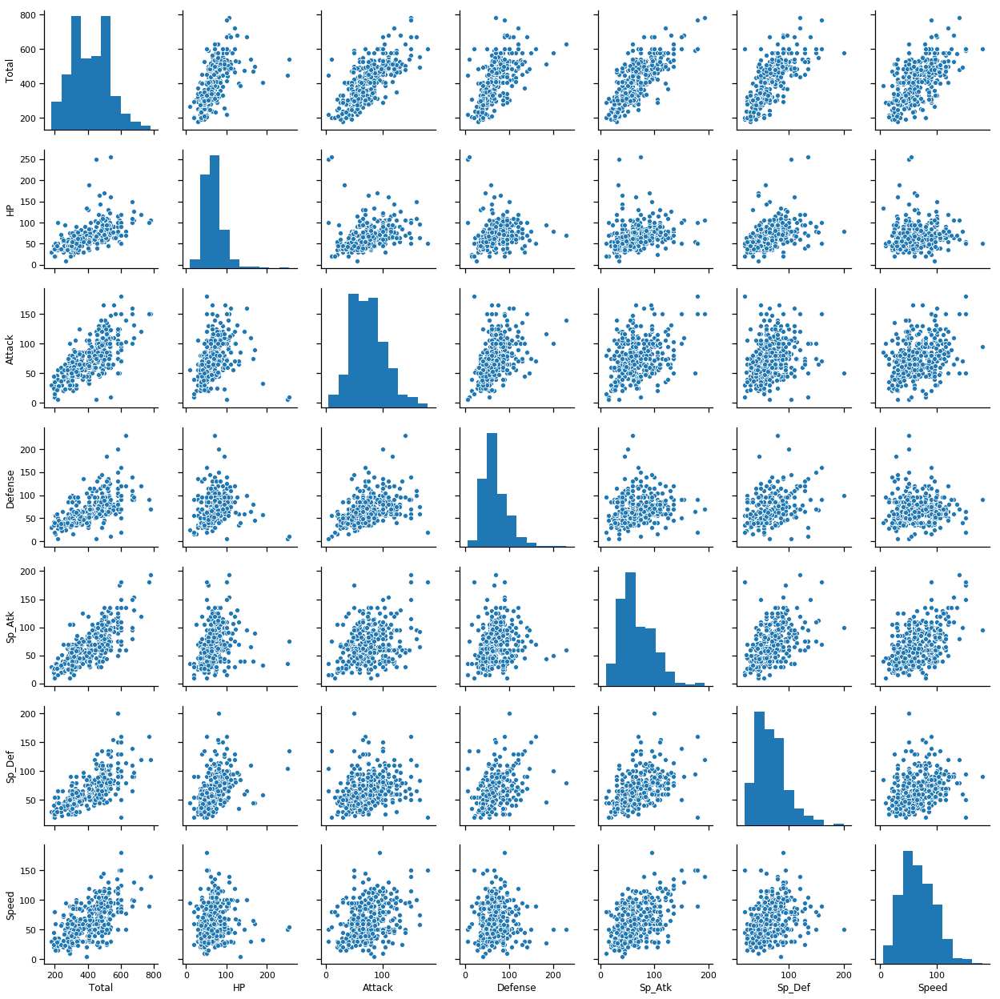

In [31]:
sns.pairplot(Type_1_df2[["Total","HP","Attack","Defense","Sp_Atk","Sp_Def","Speed"]])

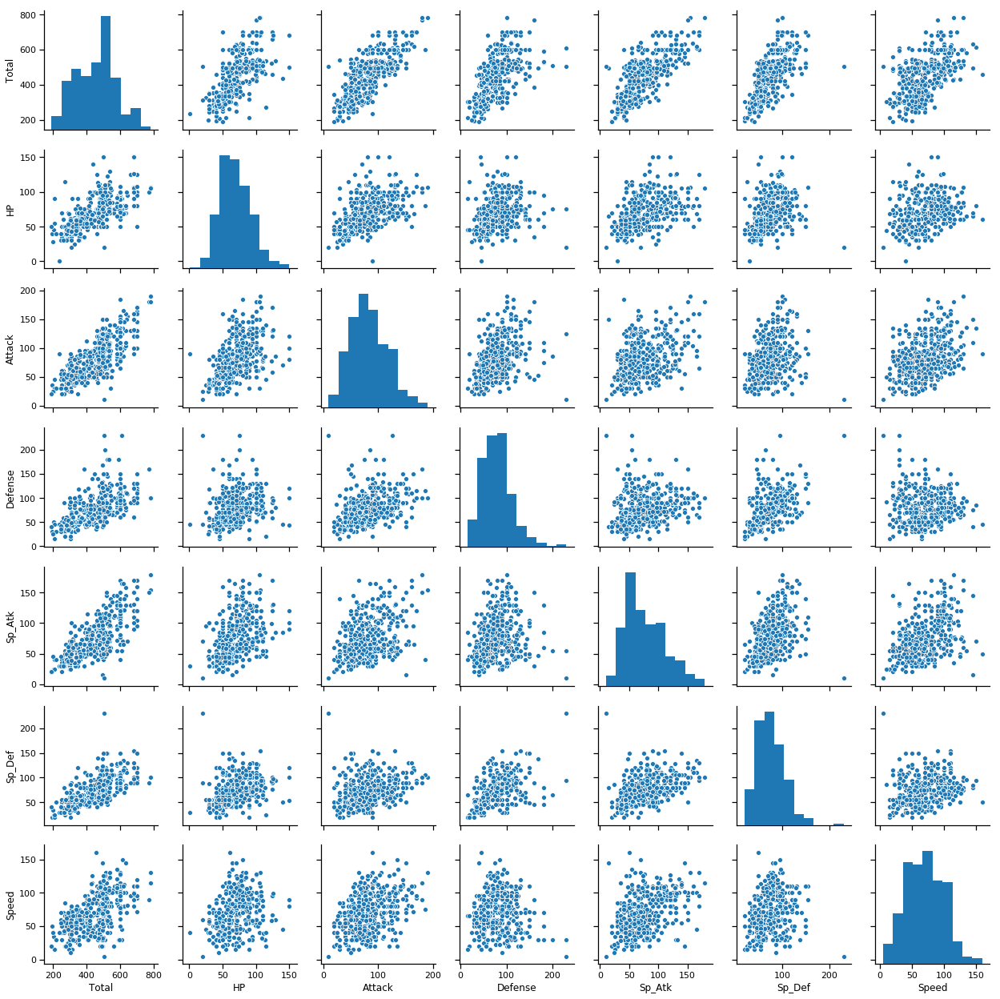

In [32]:
sns.pairplot(Type_2_df2[["Total","HP","Attack","Defense","Sp_Atk","Sp_Def","Speed"]])